# 0. Importing libraries

In [67]:
# general libraries
import pandas as pd
import numpy as np
import os
import json
import re
from tqdm import tqdm
import math
import joblib
import copy
import time

# widgets
import ipywidgets as widgets
from IPython.display import display

# plotting
import matplotlib.pyplot as plt
import seaborn as sns

# image processing
from skimage import io

# SSIM
from skimage.metrics import structural_similarity as ssim

# model selection
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate

# label encoding
from sklearn.preprocessing import LabelEncoder
from category_encoders import *

# regression models
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
import xgboost as xgb
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

# metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, r2_score, accuracy_score, classification_report, confusion_matrix, make_scorer

# clustering
from sklearn.cluster import KMeans

# clustering metrics
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# 0.1. Select parts of the code that will be executed

In [2]:
# create label widget
label_data_loading = widgets.Label(value="Data loading:")

# crate checkbox widgets
checkbox1 = widgets.Checkbox(description='Load JSON files (check if you want to load dataset with screenshots', layout=widgets.Layout(width='600px'), style={'description_width': 'initial'})
checkbox2 = widgets.Checkbox(description='Calculate SSIM value (check if you want to calculate SSIM based on screenshots', layout=widgets.Layout(width='600px'), style={'description_width': 'initial'})
checkbox3 = widgets.Checkbox(description='Load dataset directly from CSV (check if you already have dataset with SSIM column and want to load it)', layout=widgets.Layout(width='800px'), style={'description_width': 'initial'})

label_preprocessing = widgets.Label(value="Data preprocessing (if \"Perform preprocessing steps\" is checked, select which preprocessing steps should be executed):")

checkbox4 = widgets.Checkbox(description='Perform preprocessing steps', style={'description_width': 'initial'}, value=True)

# function for creating association between values and checkboxes in order to show/hide checkboxes based on their checked value
def update_association(change):
    for ch in checkbox_preprocess_list:
        ch.disabled = not checkbox4.value
        ch.value = checkbox4.value

preprocess_function_names_list = ['remove_common_css_words', 'replace_background_image', 'replace_url', 'replace_decimal',
                                  'replace_gradient', 'replace_box_shadow', 'replace_text_shadow', 'replace_filter', 'replace_transform',
                                  'replace_transition_property', 'replace_transition_timing_function', 'replace_animation_timing_function',
                                  'replace_exponential', 'replace_numeric_pixel_values', 'replace_numeric_percentage_values',
                                  'replace_rgb', 'convert_seconds', 'replace_other_numeric_values', 'remove_punctuation',
                                  'replace_animation_name', 'remove_quotation_marks']

checkbox_preprocess_list = [widgets.Checkbox(description=f'{function_name}', style={'description_width': 'initial'}, layout=widgets.Layout(margin='0 0 0 20px'), value=True) for function_name in preprocess_function_names_list]

checkbox4.observe(update_association, 'value')

label_correlation = widgets.Label(value="Correlation matrix:")

checkbox5 = widgets.Checkbox(description='Draw correlation matrix', style={'description_width': 'initial'})
checkbox6 = widgets.Checkbox(description='Remove one column from each pair with correlation value above defined threshold', layout=widgets.Layout(width='600px'), style={'description_width': 'initial'})

# initial value for correlation threshold is 0.9
numeric_widget = widgets.FloatText(
    value=0.9,
    description='Correlation threshold:',
    style={'description_width': 'initial'}
)

# show widgets
display(label_data_loading)
display(checkbox1, checkbox2, checkbox3)
display(label_preprocessing)
display(checkbox4)
display(*checkbox_preprocess_list)
display(label_correlation)
display(checkbox5)
display(checkbox6)
display(numeric_widget)

Label(value='Data loading:')

Checkbox(value=False, description='Load JSON files (check if you want to load dataset with screenshots', layou…

Checkbox(value=False, description='Calculate SSIM value (check if you want to calculate SSIM based on screensh…

Checkbox(value=False, description='Load dataset directly from CSV (check if you already have dataset with SSIM…

Label(value='Data preprocessing (if "Perform preprocessing steps" is checked, select which preprocessing steps…

Checkbox(value=True, description='Perform preprocessing steps', style=CheckboxStyle(description_width='initial…

Checkbox(value=True, description='remove_common_css_words', layout=Layout(margin='0 0 0 20px'), style=Checkbox…

Checkbox(value=True, description='replace_background_image', layout=Layout(margin='0 0 0 20px'), style=Checkbo…

Checkbox(value=True, description='replace_url', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(descri…

Checkbox(value=True, description='replace_decimal', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(de…

Checkbox(value=True, description='replace_gradient', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(d…

Checkbox(value=True, description='replace_box_shadow', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle…

Checkbox(value=True, description='replace_text_shadow', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyl…

Checkbox(value=True, description='replace_filter', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(des…

Checkbox(value=True, description='replace_transform', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(…

Checkbox(value=True, description='replace_transition_property', layout=Layout(margin='0 0 0 20px'), style=Chec…

Checkbox(value=True, description='replace_transition_timing_function', layout=Layout(margin='0 0 0 20px'), sty…

Checkbox(value=True, description='replace_animation_timing_function', layout=Layout(margin='0 0 0 20px'), styl…

Checkbox(value=True, description='replace_exponential', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyl…

Checkbox(value=True, description='replace_numeric_pixel_values', layout=Layout(margin='0 0 0 20px'), style=Che…

Checkbox(value=True, description='replace_numeric_percentage_values', layout=Layout(margin='0 0 0 20px'), styl…

Checkbox(value=True, description='replace_rgb', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(descri…

Checkbox(value=True, description='convert_seconds', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle(de…

Checkbox(value=True, description='replace_other_numeric_values', layout=Layout(margin='0 0 0 20px'), style=Che…

Checkbox(value=True, description='remove_punctuation', layout=Layout(margin='0 0 0 20px'), style=CheckboxStyle…

Checkbox(value=True, description='replace_animation_name', layout=Layout(margin='0 0 0 20px'), style=CheckboxS…

Checkbox(value=True, description='remove_quotation_marks', layout=Layout(margin='0 0 0 20px'), style=CheckboxS…

Label(value='Correlation matrix:')

Checkbox(value=False, description='Draw correlation matrix', style=CheckboxStyle(description_width='initial'))

Checkbox(value=False, description='Remove one column from each pair with correlation value above defined thres…

FloatText(value=0.9, description='Correlation threshold:', style=DescriptionStyle(description_width='initial')…

In [16]:
load_json_files_checked = checkbox1.value
calculate_SSIM_checked = checkbox2.value
load_csv_dataset_checked = checkbox3.value

preprocess_data_main_checked = checkbox4.value

preprocess_data_temp = []
for ch in checkbox_preprocess_list:
    preprocess_data_temp.append(ch.value)  

preprocess_data_functions_checked = dict(zip(preprocess_function_names_list, preprocess_data_temp))
draw_correlation_matrix_checked = checkbox5.value
remove_correlation_pairs_checked = checkbox6.value
correlation_threshold_widget = numeric_widget.value

# 1. Creating dataset from JSON files and using SSIM for comparing screenshots

## 1.1. Loading data from JSON files

In [5]:
# path to the folder with screenshots of scraped web pages
scraping_folder_path = "../Datasets/SimilarWeb dataset with screenshots"

In [6]:
# loading all JSON files from all subfolders of the current folder defined by base_folder_path parameter
def read_json_files(base_folder_path):
    # recursive search of JSON files in subfolders
    json_files = []
    for root, dirs, files in os.walk(base_folder_path):
        for file in files:
            if file.endswith('.json'):
                json_files.append(os.path.join(root, file))

    full_df = pd.DataFrame()

    # after finding JSON files, read each one of them and convert data to dataframe
    for file_path in json_files:
        with open(file_path, encoding='utf-8') as file:
            data = json.load(file)
            current_df = pd.json_normalize(data)
            full_df = pd.concat([full_df, current_df])
    
    # concatenated dataframe based on the JSON files
    print(f'First few rows of the concatenated dataframe: \n{full_df.head()}')
    print(f'Size of the concatenated dataframe: {len(full_df)}')
    
    return full_df

In [7]:
# function for renaming columns based on the regex
def rename_columns(column_name):
    # regex for renaming columns so they do not contain "cssProperties." as prefix
    rename_columns_regex_pattern = r'cssProperties\.(.*)'
    match = re.match(rename_columns_regex_pattern, column_name)
    if match:
        new_column_name = match.group(1)
        return new_column_name
    else:
        return column_name

In [8]:
full_df = None

if(load_json_files_checked):
    full_df = read_json_files(scraping_folder_path)
    
    # rename columns based on the regex
    full_df.rename(columns=rename_columns, inplace=True)

    # show column names after renaming them
    print(full_df.columns)

First few rows of the concatenated dataframe: 
               websiteUrl elementType  elementIndex     elementId  \
0  https://aliexpress.com        SPAN             0                 
1  https://aliexpress.com       INPUT             0  search-words   
2  https://aliexpress.com       INPUT             1                 
3  https://aliexpress.com        path             0                 
4  https://aliexpress.com        path             1                 

               elementClass cssProperties.accent-color  \
0                                                 auto   
1  search--keyword--15P08Ji                       auto   
2   search--submit--2VTbd-T                       auto   
3                       NaN                       auto   
4                       NaN                       auto   

  cssProperties.align-content cssProperties.align-items  \
0                      normal                    normal   
1                      normal                    normal   
2           

## 1.2. Comparing screenshots and calculating SSIM

In [9]:
# function for comparing images in three time intervals and calculating SSIM value
# parameters are screenshots created in three time intervals
def compare_images_SSIM(image1, image2, image3):
    if image1.size == image2.size == image3.size:
        # convert images to numpy arrays
        image1_array = np.array(image1)
        image2_array = np.array(image2)
        image3_array = np.array(image3)

        # compare SSIM values between first and second time interval (i.e., compare image1 and image2)
        ssim_12, _ = ssim(image1_array, image2_array, full=True, channel_axis=-1)

        # compare SSIM values between first and third time interval (i.e., compare image1 and image3)
        ssim_13, _ = ssim(image1_array, image3_array, full=True, channel_axis=-1)

        # compare SSIM values between second and third time interval (i.e., compare image2 and image3)
        ssim_23, _ = ssim(image2_array, image3_array, full=True, channel_axis=-1)
        
        # return minimum value of these three comparisons        
        return min(ssim_12, ssim_13, ssim_23)
    
    # value of -2 indicates error (e.g., screenshots in different time intervals have different dimensions)
    return -2

In [10]:
# create an empty array to store values of the SSIM for each element in the dataframe
dynamic_elements = []

if(calculate_SSIM_checked):
    # iterate over the dataframe
    for index, row in tqdm(full_df.iterrows(), total=full_df.shape[0]):
        # extract domain from URL string
        url = row['websiteUrl']
        regex = r'(?:https?:\/\/)?(?:[^@\n]+@)?(?:www\.)?([^:\/\n]+)'
        url = re.match(regex, url)[1]
        
        # load the screenshots (images) from three different time intervals for each element in the dataframe
        image1 = io.imread(f"{scraping_folder_path}/{url} screenshots and data/{row['elementType']}{row['elementIndex']} screenshot br0.png")
        image2 = io.imread(f"{scraping_folder_path}/{url} screenshots and data/{row['elementType']}{row['elementIndex']} screenshot br1.png")
        image3 = io.imread(f"{scraping_folder_path}/{url} screenshots and data/{row['elementType']}{row['elementIndex']} screenshot br2.png")

        dynamic_elements.append(compare_images_SSIM(image1, image2, image3))
        
    # log the length of 'dynamic_elements' array
    print(f'Array \"dynamic_elements\" has a length of: {len(dynamic_elements)}')
    
    # add 'dynamicElement' column into dataframe
    full_df['dynamicElement'] = dynamic_elements
    
    # remove element which contain value -2 in the 'dynamicElements' column, because this value indicated error during SSIM calculation process
    full_df = full_df[full_df['dynamicElement']!=-2]
    
    # log the first few rows of the dataframe
    print(f'First few rows of the dataframe:\n{full_df.head()}')
    
    # save dataframe
    full_df.to_csv("SimilarWeb dataset with SSIM column.csv")

100%|████████████████████████████████████████████████████████████████████████████| 22666/22666 [43:01<00:00,  8.78it/s]


Array "dynamic_elements" has a length of: 22666
First few rows of the dataframe:
               websiteUrl elementType  elementIndex     elementId  \
0  https://aliexpress.com        SPAN             0                 
1  https://aliexpress.com       INPUT             0  search-words   
2  https://aliexpress.com       INPUT             1                 
3  https://aliexpress.com        path             0                 
4  https://aliexpress.com        path             1                 

               elementClass accent-color align-content align-items align-self  \
0                                   auto        normal      normal       auto   
1  search--keyword--15P08Ji         auto        normal      normal       auto   
2   search--submit--2VTbd-T         auto        normal  flex-start       auto   
3                       NaN         auto        normal      normal       auto   
4                       NaN         auto        normal      normal       auto   

  alignment-basel

# 2. Load dataset from existing CSV file

In [11]:
def load_dataset(dataset_csv_name):
    full_df = pd.read_csv(dataset_csv_name, low_memory=False)

    # remove unwanted column which occurs when reading from CSV file
    full_df = full_df.drop(columns=['Unnamed: 0'])
    
    # log the total number of rows in the loaded dataframe
    print(f'Number of rows in the loaded dataframe: {len(full_df)}')
    
    # log the first few rows of the dataframe
    print(f'First few rows of the loaded dataframe: {full_df.head()}')
    
    return full_df

In [12]:
if(load_csv_dataset_checked):
    full_df = load_dataset("SimilarWeb dataset with SSIM column.csv")

Number of rows in the loaded dataframe: 22290
First few rows of the loaded dataframe:                websiteUrl elementType  elementIndex     elementId  \
0  https://aliexpress.com        SPAN             0           NaN   
1  https://aliexpress.com       INPUT             0  search-words   
2  https://aliexpress.com       INPUT             1           NaN   
3  https://aliexpress.com        path             0           NaN   
4  https://aliexpress.com        path             1           NaN   

               elementClass accent-color align-content align-items align-self  \
0                       NaN         auto        normal      normal       auto   
1  search--keyword--15P08Ji         auto        normal      normal       auto   
2   search--submit--2VTbd-T         auto        normal  flex-start       auto   
3                       NaN         auto        normal      normal       auto   
4                       NaN         auto        normal      normal       auto   

  alignment-

In [13]:
print(f'Shape of the loaded dataframe: {full_df.shape}')

Shape of the loaded dataframe: (22290, 358)


# 3. Data cleaning and preprocessing

## 3.1. Removing duplicate rows

In [14]:
# list of columns to be excluded when checking for duplicate rows
columns_to_exclude = ['websiteUrl', 'elementIndex', 'elementId', 'elementClass']

# creating list of columns to check for duplicates, excluding the ones present in "columns_to_exclude"
columns_to_check_duplicates = [col for col in full_df.columns if col not in columns_to_exclude]

# using "columns_to_check_duplicates" as subset parameter
full_df = full_df.drop_duplicates(subset=columns_to_check_duplicates)

In [15]:
print(f'Shape of the dataframe after removing duplicate rows: {full_df.shape}')

Shape of the dataframe after removing duplicate rows: (13947, 358)


## 3.2. Removing rows where "elementType" has less than 10 occurences

In [17]:
# number of unique values in "elementType" column
value_counts = full_df['elementType'].value_counts()

# remove values with less than 10 occurences
valid_values = value_counts[value_counts >= 10].index

# filter the dataframe based on the number of occurences in "elementType" column
full_df = full_df[full_df['elementType'].isin(valid_values)]

In [18]:
print(f'Shape of the dataframe after removing data with less than 10 occurences in \"elementType" column: {full_df.shape}')

Shape of the dataframe after removing data with less than 10 occurences in "elementType" column: (13889, 358)


## 3.3. Missing values check

In [19]:
# check the dataframe for the missing values
columns_with_na = full_df.columns[full_df.isna().any()].tolist()

if len(columns_with_na) > 0:
    print("Following colums containt missing values:")
    for column in columns_with_na:
        print(column)
else:
    print("There are no missing values in the dataframe.")

Following colums containt missing values:
elementId
elementClass


## 3.4. Data preprocessing

In [20]:
# removing columns which will not be used in the training and testing process (column named "d" is present in the dataframe, although it does not represent a known CSS property)
full_df = full_df.drop(columns=['d', 'elementIndex', 'websiteUrl', 'elementClass', 'elementId'])

In [21]:
print(f'Shape of the dataframe after removing unnecessary columns: {full_df.shape}')

Shape of the dataframe after removing unnecessary columns: (13889, 353)


In [22]:
# change column values into strings
full_df = full_df.astype(str)

In [23]:
# function for removing common words from the string passed as the parameter
def remove_common_css_words(text):
    common_css_words_list = [
        "none",
        "auto",
        "visible",
        "hidden",
        "repeat",
        "inherit",
        "normal",
        "medium",
        "start",
        "end",
        "-webkit",
        "no",
        "non",
        "not",
    ]
    
    for word in common_css_words_list:
        try:
            text = re.sub(word, "null", str(text))
        except:
            print(f'Erros is: {text}, {word}')
    return text

In [24]:
# function for replacing values of "background-image" CSS property with string "has_background_image"
def replace_background_image(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_background_image"

In [25]:
# function for replacing URL value with string "url"
def replace_url(text):
    pattern = r"url\(.*"
    matches = re.findall(pattern, text)
    for m in matches:
        text = text.replace(m, "url")
    return text

In [26]:
# function for removing decimal places in the numeric values
def replace_decimal(text):
    text = re.sub(r"\.\d+", "", text)
    return text

In [27]:
# function for changing CSS property values which contain word "gradient" just with the word "gradient"
# (e.g., linear-gradient(45deg, blue, red) will be replaced with "gradient"
def replace_gradient(text):
    if "gradient" in text.lower():
        return "gradient"
    return text

In [28]:
# function for replacing values of "box-shadow" CSS property with string "has_box_shadow"
def replace_box_shadow(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_box_shadow"

In [29]:
# function for replacing values of "text-shadow" CSS property with string "has_text_shadow"
def replace_text_shadow(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_text_shadow"

In [30]:
# function for replacing values of "filter" CSS property with string "is_filtered"
def replace_filter(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "is_filtered"

In [31]:
# function for replacing values of "transform" CSS property with string "is_transformed"
def replace_transform(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "is_transformed"

In [32]:
# function for replacing values of "transition-property" CSS property with string "has_transition_property"
def replace_transition_property(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_transition_property"

In [33]:
# function for replacing values of "transition-timing-function" CSS property with string "has_transition_timing_function"
def replace_transition_timing_function(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_transition_timing_function"

In [34]:
# function for replacing values of "transition-property" CSS property with string "has_animation_name"
def replace_animation_name(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_animation_name"

In [35]:
# function for replacing values of "animation-timing-function" CSS property with string "has_animation_timing_function"
def replace_animation_timing_function(text):
    if 'null' not in text.lower() and 'none' not in text.lower():
        return "has_animation_timing_function"

In [36]:
# function for calculating RGB distance
def calculate_rgb_distance(values):
    r = int(values[0].strip())
    g = int(values[1].strip())
    b = int(values[2].strip())

    # white color
    distance_white = math.sqrt((255 - r) ** 2 + (255 - g) ** 2 + (255 - b) ** 2)

    # black color
    distance_black = math.sqrt(r ** 2 + g ** 2 + b ** 2)

    # red color
    distance_red = math.sqrt((255 - r) ** 2 + g ** 2 + b ** 2)

    # green color
    distance_green = math.sqrt(r ** 2 + (255 - g) ** 2 + b ** 2)

    # blue color
    distance_blue = math.sqrt(r ** 2 + g ** 2 + (255 - b) ** 2)

    # find the minimum distance of the current color and predefined colors
    minimum = min([distance_white, distance_black, distance_red, distance_green, distance_blue])
    
    # return color name based on the minimum distance
    if minimum == distance_white:
        return "white"
    elif minimum == distance_black:
        return "black"
    elif minimum == distance_red:
        return "red"
    elif minimum == distance_green:
        return "green"
    return "blue"

In [37]:
# function for replacing RGB values with color names
def replace_rgb(text):
    # convert RGBA into RGB values
    text = text.replace("rgba(", "rgb(")
    rgba_match = re.findall("rgb\(\d+, \d+, \d+, \d+\)", text)
    
    # find RGBA values, split on the comma and join all except for the last value (the one representing A)
    for rgba in rgba_match:
        rgba_split = rgba.split(",")
        rgb_join = ",".join(rgba_split[:-1]) + ")"
        text = text.replace(rgba, rgb_join)

    # find all occurences of RGB values based on the regex
    matches = re.findall("rgb\(\d+, \d+, \d+\)", text)

    for m in matches:
        initial_match = m
        m = m.replace("rgb(", "")
        m = m.replace(")", "")
        values = m.split(",")

        # call function "calculate_rgb_distance" to calculate RGB distance
        final_values = calculate_rgb_distance(values)
        
        # replace initial RGB value with closest color value
        text = text.replace(initial_match, final_values)

    return text

In [38]:
# function which sorts negative numeric values in ascending order and positive numeric values in descending order
def sort_list(numeric_values_list):
    # numeric values need to be sorted so that numbers with largest absolute values come first
    # sort negative numeric values in ascending order
    negative_values_list = [x for x in numeric_values_list if x<0]
    # sort positive numeric values in descending order
    positive_values_list = [x for x in numeric_values_list if x>=0]
    negative_values_list.sort()
    positive_values_list.sort(reverse=True)
    # negative values should be concatenated before positive values (this is important for preventing situations where "9" in "-9" is replaced without minus sign)
    return negative_values_list + positive_values_list

In [39]:
# function for converting exponential values (e.g., 10e2) into its standard decimal form
def replace_exponential(text):
    # regex for exponential numeric values
    pattern = r"(\d+)e([+-]?\d+)"

    # find exponential numeric values in the string based on the regex
    all_numeric_exponential = re.findall(pattern, text)

    if len(all_numeric_exponential) == 0:
        return text
    
    # list of all regex matches
    matches_list = []
    # list of all values after converting them into standard decimal form
    values_list = []
    for numeric_value in all_numeric_exponential:
        base_value = int(numeric_value[0])
        exponent = int(numeric_value[1])
        
        # special case for negative exponent values
        if exponent < 0:
            values_list.append(0)
        else:
            values_list.append(int(base_value*math.pow(base_value, exponent)))
        
        matches_list.append(numeric_value)
    
    for i in range(len(values_list)):
        text = text.replace(f"{matches_list[i][0]}e{matches_list[i][1]}", f"{values_list[i]}")
    
    return text

In [40]:
# function for replacing numeric values expressed in seconds with string "value_in_seconds"
def convert_seconds(text):
    # find all occurences of numeric values expressed in seconds
    matches = re.findall("-?\d+\.?\d*s", text)

    for m in matches:
        text = text.replace(m, "value_in_seconds")
    
    return text

In [41]:
# function for replacing numeric pixel values with the range they belong to
# ranges: 
    # "xsmall_pixel" <= 100px
    # "small_pixel" >100px and <=400px
    # "medium_pixel" >400px and <=800px
    # "large_pixel" >800px and <=1200px
    # "xlarge_pixel" >1200px
def replace_numeric_pixel_values(text):
    # regex for finding numeric pixel values
    pattern = r"-?\d+px"

    # find all occurences of numeric pixel values based on the regex
    all_numeric_pixel_values = re.findall(pattern, text)

    if len(all_numeric_pixel_values) == 0:
        return text
    
    # list of all regex matches
    matches_list = []
    for numeric_value in all_numeric_pixel_values:
        value = re.findall(r"-?\d+", numeric_value)[0]
        value = int(value)
        matches_list.append(value)
    
    # sort list of matches
    matches_list = sort_list(matches_list)
    
    for value in matches_list:
        # if the value is negative, add prefix "negative"
        prefix = ""
        if(value<0):
            prefix = "negative_"

        # special case is value 0
        # value 0 is replaced with "near_zero_pixel"
        # value of -0 can occur
        if(value==0):
            text = text.replace("-0px", f"negative_near_zero_pixel")
            text = text.replace("0px", f"near_zero_pixel")
            continue
        
        # use the absolute value of the numeric pixel
        # check the value and assign it to range
        if abs(value) <= 100:
            text = text.replace(f"{value}px", f"{prefix}xsmall_pixel")
        elif abs(value) > 100 and abs(value) <= 400:
            text = text.replace(f"{value}px", f"{prefix}small_pixel")
        elif abs(value) > 400 and abs(value) <= 800:
            text = text.replace(f"{value}px", f"{prefix}medium_pixel")
        elif abs(value) > 800 and abs(value) <= 1200:
            text = text.replace(f"{value}px", f"{prefix}large_pixel")
        else:
            text = text.replace(f"{value}px", f"{prefix}xlarge_pixel")
    
    return text

In [42]:
# function for replacing numeric percentage values with the range they belong to
# ranges: 
    # "xsmall_percentage" <= 15%
    # "small_percentage" >15% and <=35%
    # "medium_percentage" >35% and <=60%
    # "large_percentage" >60% and <=85%
    # "xlarge_percentage" >85%
def replace_numeric_percentage_values(text):
    # regex for finding numeric percentage values
    pattern = r"-?\d+%"

    # find all occurences of numeric percentage values based on the regex
    all_numeric_percentage_values = re.findall(pattern, text)    

    if len(all_numeric_percentage_values) == 0:
        return text
    
    # list of all regex matches
    matches_list = []    
    for numeric_value in all_numeric_percentage_values:
        value = re.findall(r"-?\d+", numeric_value)[0]
        value = int(value)
        matches_list.append(value)
    
    # sort list of matches
    matches_list = sort_list(matches_list)    
    
    for value in matches_list:        
        # if the value is negative, add prefix "negative"
        prefix = ""
        if(value<0):
            prefix = "negative_"
            
        # special case is value 0
        # value 0 is replaced with "near_zero_percentage"
        # value of -0 can occur
        if(value==0):
            text = text.replace("-0%", f"negative_near_zero_percentage")
            text = text.replace("0%", f"near_zero_percentage")
            # nema potreba da se vise bilo sta provjerava u ovoj iteraciji
            continue

        # use the absolute value of the numeric pixel
        # check the value and assign it to range
        if abs(value) <= 15:
            text = text.replace(f"{value}%", f"{prefix}xsmall_percentage")
        elif abs(value) > 15 and abs(value) <= 35:
            text = text.replace(f"{value}%", f"{prefix}small_percentage")
        elif abs(value) > 35 and abs(value) <= 60:
            text = text.replace(f"{value}%", f"{prefix}medium_percentage")
        elif abs(value) > 60 and abs(value) <= 85:
            text = text.replace(f"{value}%", f"{prefix}large_percentage")
        else:
            text = text.replace(f"{value}%", f"{prefix}xlarge_percentage")

    return text

In [43]:
# function for replacing numeric values which do not have pixel, percentage or seconds as the measuring unit with the range they belong to
# ranges: 
    # "xsmall_numeric" <= 10
    # "small_numeric" >10 and <=50
    # "medium_numeric" >50 and <=100
    # "large_numeric" >100 and <=400
    # "xlarge_numeric" >400
def replace_other_numeric_values(text):
    # regex for finding other numeric values
    matches = re.findall("-?\d+", text)
    
    # list of all regex matches
    matches_list = []

    for m in matches:
        m = re.findall("-?\d+", m)[0]
        value = int(m)
        matches_list.append(value)
    
    # sort list of matches
    matches_list = sort_list(matches_list)
    
    for value in matches_list:
        # if the value is negative, add prefix "negative"
        prefix = ""
        if(value<0):
            prefix = "negative_"
        
        # special case is value 0
        # value 0 is replaced with "near_zero_percentage"
        # value of -0 can occur
        if(value==0):
            text = text.replace("-0", f"negative_near_zero_numeric")
            text = text.replace("0", f"near_zero_numeric")
            continue
        
        # use the absolute numeric value
        # check the value and assign it to range
        if abs(value) <= 10:
            text = text.replace(f"{value}", f"{prefix}xsmall_numeric")
        elif abs(value) > 10 and abs(value) <= 50:
            text = text.replace(f"{value}", f"{prefix}small_numeric")
        elif abs(value) > 50 and abs(value) <= 100:
            text = text.replace(f"{value}", f"{prefix}medium_numeric")
        elif abs(value) > 100 and abs(value) <= 400:
            text = text.replace(f"{value}", f"{prefix}large_numeric")
        else:
            text = text.replace(f"{value}", f"{prefix}xlarge_numeric")

    return text

In [44]:
# function for removing punctuation symbols (i.e., "." and ",")
def remove_punctuation(text):
    text = re.sub(r'\.', "", text)
    text = re.sub(r',', "", text)
    return text

In [45]:
# function for removing quotation marks
def remove_quotation_marks(text):
    text = re.sub(r'"', "", text)
    text = re.sub(r"'", "", text)
    return text

In [46]:
def preprocess_dataframe(main_df, preprocess_data_functions_checked):
    
    df = copy.deepcopy(main_df)
    
    # list of the columns which will be excluded from preprocessing steps    
    exclude_columns = ['websiteUrl', 'elementType', 'elementId', 'elementClass', 'dynamicElement', 'font-family']
    
    print("Step 1")
    
    ##### 1. step #####
    if(preprocess_data_functions_checked['remove_common_css_words']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(remove_common_css_words)
    ##### ------- #####
    
    print("Step 2")
    
    ##### 2. step #####
    if(preprocess_data_functions_checked['replace_background_image']):
        df['background-image'] = df['background-image'].apply(replace_background_image)
        exclude_columns.append('background-image')
    ##### -------- #####
    
    print("Step 3")
    
    ##### 3. step #####
    if(preprocess_data_functions_checked['replace_url']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_url)
    ##### -------- #####
    
    print("Step 4")
    
    ##### 4. step #####
    if(preprocess_data_functions_checked['replace_decimal']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_decimal)
    ##### -------- #####
    
    print("Step 5")
    
    ##### 5. step #####
    if(preprocess_data_functions_checked['replace_gradient']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_gradient)
    ##### -------- #####
    
    print("Step 6")
    
    ##### 6. step #####
    if(preprocess_data_functions_checked['replace_box_shadow']):
        df['box-shadow'] = df['box-shadow'].apply(replace_box_shadow)
        exclude_columns.append('box-shadow')
    ##### -------- #####
    
    print("Step 7")
    
    ##### 7. step #####
    if(preprocess_data_functions_checked['replace_text_shadow']):
        df['text-shadow'] = df['text-shadow'].apply(replace_text_shadow)
        exclude_columns.append('text-shadow')
    ##### -------- #####
    
    print("Step 8")

    ##### 8. step #####
    if(preprocess_data_functions_checked['replace_filter']):
        df['filter'] = df['filter'].apply(replace_filter)
        exclude_columns.append('filter')
    ##### -------- #####
    
    print("Step 9")

    ##### 9. step #####
    if(preprocess_data_functions_checked['replace_transform']):
        df['transform'] = df['transform'].apply(replace_transform)
        exclude_columns.append('transform')
    ##### -------- #####
    
    print("Step 10")
    
    ##### 10. step #####
    if(preprocess_data_functions_checked['replace_transition_property']):
        df['transition-property'] = df['transition-property'].apply(replace_transition_property)
        exclude_columns.append('transition-property')
    ##### -------- #####
    
    print("Step 11")
    
    ##### 11. step #####
    if(preprocess_data_functions_checked['replace_transition_timing_function']):
        df['transition-timing-function'] = df['transition-timing-function'].apply(replace_transition_timing_function)
        exclude_columns.append('transition-timing-function')
    ##### -------- #####
    
    print("Step 12")
    
    ##### 12. step #####
    if(preprocess_data_functions_checked['replace_animation_name']):
        df['animation-name'] = df['animation-name'].apply(replace_animation_name)
        exclude_columns.append('animation-name')
    ##### -------- #####
    
    print("Step 13")
    
    ##### 13. step #####
    if(preprocess_data_functions_checked['replace_animation_timing_function']):
        df['animation-timing-function'] = df['animation-timing-function'].apply(replace_animation_timing_function)
        exclude_columns.append('animation-timing-function')
    ##### -------- #####
    
    print("Step 14")
    
    ##### 14. step #####
    if(preprocess_data_functions_checked['replace_rgb']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_rgb)
    ##### -------- #####
    
    print("Step 15")
    
    ##### 15. step #####
    if(preprocess_data_functions_checked['replace_exponential']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_exponential)
    ##### -------- #####
    
    print("Step 16")
    
    ##### 16. step #####
    if(preprocess_data_functions_checked['convert_seconds']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(convert_seconds)
    ##### -------- #####
    
    print("Step 17")
    
    ##### 17. step #####
    if(preprocess_data_functions_checked['replace_numeric_pixel_values']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_numeric_pixel_values)
    ##### -------- #####
    
    print("Step 18")
    
    ##### 18. step #####
    if(preprocess_data_functions_checked['replace_numeric_percentage_values']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_numeric_percentage_values)
    ##### -------- #####
    
    print("Step 19")

    ##### 19. step #####
    if(preprocess_data_functions_checked['replace_other_numeric_values']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(replace_other_numeric_values)
    ##### -------- #####
    
    print("Step 20")
    
    ##### 20. step #####
    if(preprocess_data_functions_checked['remove_punctuation']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(remove_punctuation)
    ##### -------- #####
    
    print("Step 21")
    
    ##### 21. step #####
    if(preprocess_data_functions_checked['remove_quotation_marks']):
        df[df.columns.difference(exclude_columns)] = df[df.columns.difference(exclude_columns)].applymap(remove_quotation_marks)
    ##### -------- #####
    
    return df

In [47]:
# create an empty dataframe to store preprocessed data
preprocessed_df = None

if(preprocess_data_main_checked):
    preprocessed_df = preprocess_dataframe(full_df, preprocess_data_functions_checked)

Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
Step 12
Step 13
Step 14
Step 15
Step 16
Step 17
Step 18
Step 19
Step 20
Step 21


In [49]:
print(f'Shape of the dataframe after preprocessing data: {preprocessed_df.shape}')

Shape of the dataframe after preprocessing data: (13889, 353)


### 3.4.1. Remove columns with only one unique value

In [50]:
# function for removing columns with only one unique value
def remove_columns_with_same_values(df):
    for column in df.columns:
        if df[column].nunique() == 1:
            df.drop(column, axis=1, inplace=True)
    return df

In [51]:
final_df = remove_columns_with_same_values(preprocessed_df)

In [52]:
print(f'Shape of the dataframe after removing columns with only one unique value: {final_df.shape}')

Shape of the dataframe after removing columns with only one unique value: (13889, 212)


### 3.4.2. Remove rows with empty string values

In [53]:
# check if rows contain empty string values
empty_string_counts = (final_df == '').sum()
print(empty_string_counts['content'])

3


In [54]:
# replace empty strings with NaN
final_df.replace('', np.nan, inplace=True)

# remve rows with NaN values (i.e., empty strings)
final_df.dropna(inplace=True)

In [55]:
print(f'Shape of the dataframe after removing rows with empty strings: {final_df.shape}')

Shape of the dataframe after removing rows with empty strings: (13886, 212)


# 4. Data visualization

## 4.1. Unique values per column

In [56]:
# find unique values in each column
for column in final_df.columns:
    if column not in ['websiteUrl', 'elementType', 'elementId', 'elementClass', 'dynamicElement']:
        unique_values = preprocessed_df[column].unique()
        print(f'Unique values for {column} are: {unique_values}')

Unique values for align-content are: ['normal' 'stretch']
Unique values for align-items are: ['normal' 'flex-start' 'center' 'stretch' 'flex-end']
Unique values for align-self are: ['auto' 'center' 'flex-end' 'flex-start' 'baseline']
Unique values for animation-fill-mode are: ['none' 'forwards' 'both' 'backwards']
Unique values for animation-iteration-count are: ['xsmall_numeric' 'infinite']
Unique values for app-region are: ['none' 'no-drag']
Unique values for appearance are: ['none' 'button' 'auto' 'textfield']
Unique values for backdrop-filter are: ['none' 'blur(xsmall_pixel)']
Unique values for backface-visibility are: ['visible' 'hidden']
Unique values for background-attachment are: ['scroll' 'scroll scroll scroll scroll scroll' 'scroll scroll']
Unique values for background-blend-mode are: ['normal' 'normal normal normal normal normal' 'normal normal']
Unique values for background-clip are: ['border-box' 'text'
 'border-box border-box border-box border-box border-box'
 'border-box

## 4.2. Plot of the distribution of values in the "elementType" column

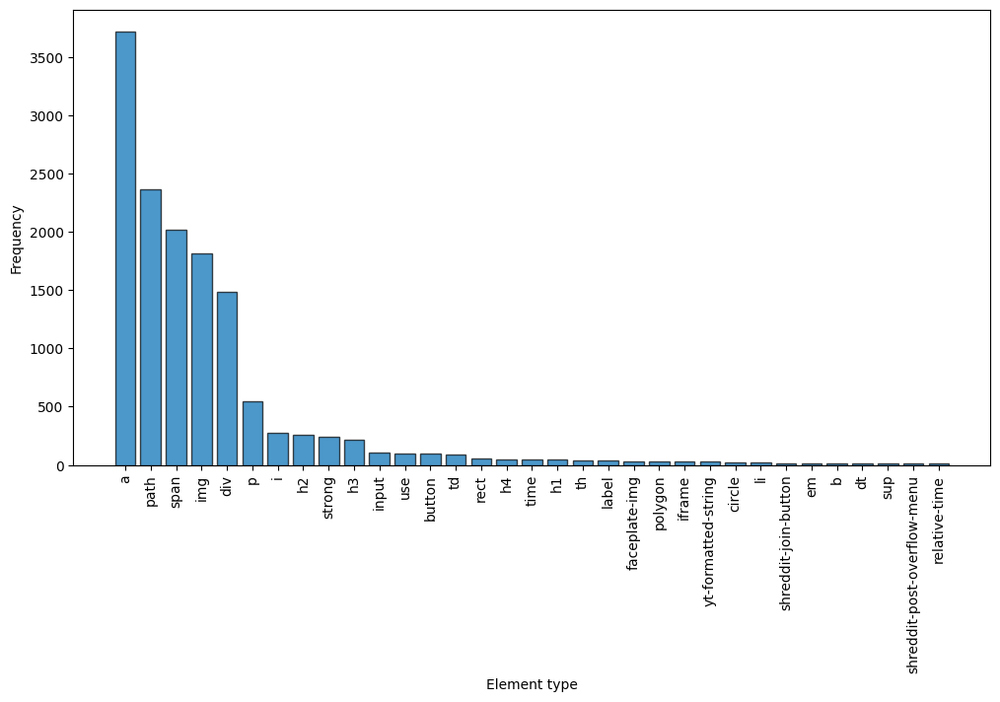

In [59]:
# figure size
plt.figure(figsize=(12, 6))

# count number of occurences for each "elementType"
elementType_counts = final_df['elementType'].value_counts()

# change the text into lowercase
lowercase_indices = [x.lower() for x in elementType_counts.index]

# plot
bars = plt.bar(lowercase_indices, elementType_counts.values, color='#006cb5', edgecolor='black', alpha=0.7)

# add label to x and y-axis
plt.xlabel('Element type')
plt.ylabel('Frequency')

# rotate x-axis in order to vertically place labels
plt.xticks(rotation='vertical')

# show plot
plt.show()

## 4.3. Histogram of distribution of the "dynamicElement" (target) column values

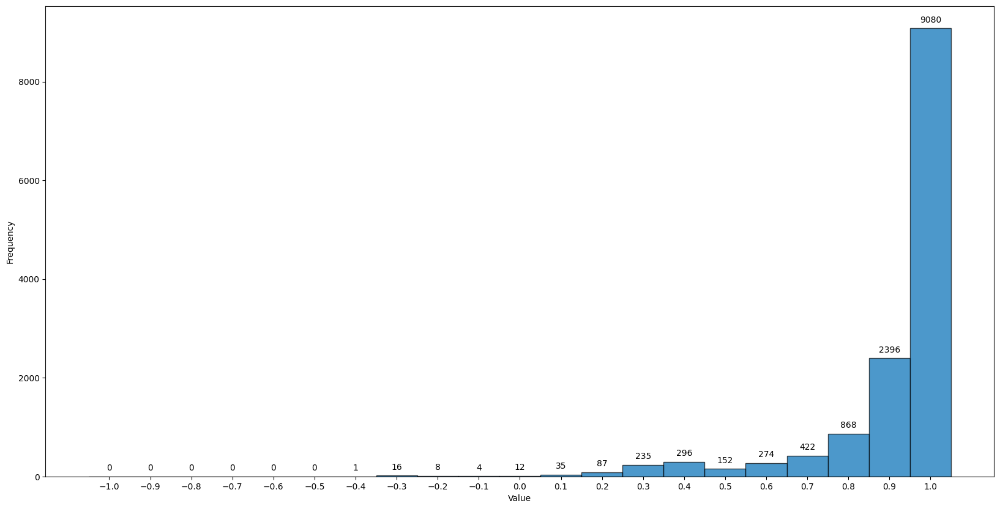

In [61]:
# create a histogram with bins of width 0.1
bins = np.arange(-1.05, 1.06, 0.1)
fig, ax = plt.subplots(figsize=(20, 10))

# calculate the histogram
counts, bin_edges, patches = ax.hist(np.array(final_df['dynamicElement'],dtype=np.float32), bins=bins, color="#006cb5", edgecolor='black', alpha=0.7)

# add text annotations for each bin
for count, patch in zip(counts, patches):
    ax.annotate(f'{int(count)}', 
                (patch.get_x() + patch.get_width() / 2, patch.get_height()), 
                textcoords="offset points", 
                xytext=(0, 5), 
                ha='center', 
                va='bottom')

plt.xlabel('Value')
plt.ylabel('Frequency')

plt.xticks(np.arange(-1.0, 1.1, 0.1))

plt.show()

# 5. Training the machine learning models

## 5.1. Data preparation for model training

### 5.1.1. Label encoder

In [68]:
# split dataset into features (X) and target (y)
X = final_df.drop('dynamicElement', axis=1)
y = copy.deepcopy(final_df['dynamicElement'])

enc = OrdinalEncoder().fit(X)
X_encoded = enc.transform(X)

In [69]:
# save column names into the list
column_names = X_encoded.columns.tolist()

### 5.1.2. Correlation matrix

In [70]:
# calculate the correlation matrix
correlation_matrix = X_encoded.corr()

In [71]:
# function for plotting correlation matrix
def plot_correlation_matrix(correlation_matrix):
    # figure size
    fig, ax = plt.subplots(figsize=(200, 200))

    # create heatmap using seaborn
    heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, ax=ax)

    # rotate y-axis labels
    heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)

    # save correlation matrix as image
    plt.title('Correlation Matrix')
    plt.savefig('./Slike iz koda/correlation_matrix.jpeg', bbox_inches='tight')
    plt.show()

if(draw_correlation_matrix_checked):
    plot_correlation_matrix(correlation_matrix)

In [72]:
# find pairs of columns with correlation value >= correlation_threshold_widget
high_correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) >= correlation_threshold_widget:
            high_correlation_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

# log the pairs of columns with correlation value >= correlation_threshold_widget
print(f'Pairs of columns with correlation value >= {correlation_threshold_widget}:')
for pair in high_correlation_pairs:
    print(pair)

Pairs of columns with correlation value >= 0.9:
('background-attachment', 'background-blend-mode')
('background-attachment', 'background-origin')
('background-blend-mode', 'background-origin')
('block-size', 'height')
('border-block-end-color', 'border-block-start-color')
('border-block-end-color', 'border-bottom-color')
('border-block-end-color', 'border-inline-end-color')
('border-block-end-color', 'border-inline-start-color')
('border-block-end-color', 'border-left-color')
('border-block-end-color', 'border-right-color')
('border-block-end-color', 'border-top-color')
('border-block-end-color', 'caret-color')
('border-block-end-color', 'color')
('border-block-end-color', 'column-rule-color')
('border-block-end-color', 'outline-color')
('border-block-end-color', 'text-decoration-color')
('border-block-end-color', 'text-emphasis-color')
('border-block-end-color', '-webkit-text-fill-color')
('border-block-end-color', '-webkit-text-stroke-color')
('border-block-end-style', 'border-block-

#### 5.1.2.1. Remove one of the columns from each pair of columns with high correlation value

In [73]:
# function for finding pairs of columns with correlation >= correlation_threshold_widget and removing one of the columns in the pair
def remove_correlation_pairs(X_encoded, correlation_matrix):
    # calculate the number of unique values for each column
    unique_values_count = {col: X_encoded[col].nunique() for col in X_encoded.columns}
    
    # create a set which contains columns to be removed
    duplicate_correlations = set()
    for i in range(len(correlation_matrix.columns)):
        for j in range(i + 1, len(correlation_matrix.columns)):
            # check the correlation value and compare it with correlation_threshold_widget value
            if abs(correlation_matrix.iloc[i, j]) >= correlation_threshold_widget:
                col1 = correlation_matrix.columns[i]
                col2 = correlation_matrix.columns[j]
                
                # when deciding which column to remove, calculate the number of unique values it contains
                # the column with less unique values will be removed
                if unique_values_count[col1] > unique_values_count[col2]:
                    duplicate_correlations.add(col2)
                else:
                    duplicate_correlations.add(col1)
    
    # remove columns in "duplicate_correlations" variable from the dataset
    X_encoded = X_encoded.drop(columns=duplicate_correlations)
    
    return X_encoded

if(remove_correlation_pairs_checked):
    X_encoded = remove_correlation_pairs(X_encoded, correlation_matrix)

In [75]:
print(f'Shape of the dataframe after removing columns which have high correlation with other column(s): {X_encoded.shape}')

Shape of the dataframe after removing columns which have high correlation with other column(s): (13886, 142)


### 5.1.3. Split the dataset into training and test sets

In [76]:
# split the dataset into training and test sets
X_train_le, X_test_le, y_train_le, y_test_le = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

In [78]:
print(f'First few rows of the training subset:\n{X_train_le.head()}')

First few rows of the training subset:
       elementType  align-content  align-items  align-self  \
10355            6              1            1           1   
3865             4              1            3           1   
1910             4              1            1           1   
10512            5              1            1           1   
22106            5              1            1           1   

       animation-fill-mode  animation-iteration-count  app-region  appearance  \
10355                    1                          1           1           1   
3865                     1                          1           1           1   
1910                     1                          1           1           1   
10512                    1                          1           1           1   
22106                    1                          1           1           1   

       backdrop-filter  backface-visibility  ...  -webkit-mask-image  \
10355                1       

In [79]:
# save column names after label encoding and removing columns with high correlation into the list
column_names_after_correlation = X_train_le.columns.tolist()

In [81]:
# export the subests into CSV files
X_train_le.to_csv('Data for R/X_train_le.csv', index=False)
y_train_le.to_csv('Data for R/y_train_le.csv', index=False)
X_test_le.to_csv('Data for R/X_test_le.csv', index=False)
y_test_le.to_csv('Data for R/y_test_le.csv', index=False)

## 5.2. Model training

### 5.2.0. Calculating metrics

In [90]:
# function for calculating MAE, MSE, RMSE and R-squared metrics based on the true values and the predicted values
def evaluate_model_metrics(model_name, true_values, predicted_values, additional_parameters=""):
    print(f'Metrics for model {model_name} and parameters {additional_parameters}')
    # calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(true_values, predicted_values)
    print("Mean Absolute Error (MAE):", mae)
    
    # calculate Mean Squared Error (MSE)
    mse = mean_squared_error(true_values, predicted_values)
    print("Mean Squared Error (MSE):", mse)

    # calculate Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    print("Root Mean Squared Error (RMSE):", rmse)

    # calculate R-squared
    r_squared = r2_score(true_values, predicted_values)
    print("R-squared (R^2):", r_squared)
    
    return (mae, mse, rmse, r_squared)

### 5.2.1. KNN

#### 5.2.1.1. Hyperparameter tuning

In [83]:
# set up the paramter grid for KNN
param_grid_knn = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 20, 50, 100, 110, 150, 200],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

# initialize the KNN model
knn_model = KNeighborsRegressor()

# GridSearchCV for KNN
grid_search_knn = GridSearchCV(estimator=knn_model, param_grid=param_grid_knn, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# train the model
grid_search_knn.fit(X_train_le, np.array(y_train_le, dtype=np.float32))

# find best parameters for KNN
print(f"Best parameters for KNN are: {grid_search_knn.best_params_}")

Fitting 5 folds for each of 104 candidates, totalling 520 fits
Best parameters for KNN are: {'algorithm': 'auto', 'n_neighbors': 15, 'weights': 'distance'}


#### 5.2.1.2. Best model

In [84]:
# create KNN regression model
knn_model_le = KNeighborsRegressor(algorithm="auto", n_neighbors=15, weights="distance")

# train the model
knn_model_le.fit(X_train_le, np.array(y_train_le, dtype=np.float32))

# define metrics for training and validation
knn_training_scoring_le = {
    'mse': make_scorer(mean_squared_error, greater_is_better=False),
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'r2': 'r2'
}

# perform cross-validation
knn_training_results_le = cross_validate(knn_model_le, X_train_le, np.array(y_train_le, dtype=np.float32), cv=5, scoring=knn_training_scoring_le, return_train_score=True)

# output fit time, score time, and MSE, MAE, R-squared metrics for each fold during training and validation
print("Fit time: ", knn_training_results_le['fit_time'])
print("Score time: ", knn_training_results_le['score_time'])
print("Training MSE for each fold:", -knn_training_results_le['train_mse'])
print("Validation MSE for each fold:", -knn_training_results_le['test_mse'])
print("Training MAE for each fold:", -knn_training_results_le['train_mae'])
print("Validation MAE for each fold:", -knn_training_results_le['test_mae'])
print("Training R^2 for each fold:", knn_training_results_le['train_r2'])
print("Validation R^2 for each fold:", knn_training_results_le['test_r2'])

# output average fit time, score time, and MSE, MAE, R-squared metrics for training and validation
print(f"Average Fit time: {np.mean(knn_training_results_le['fit_time']):.3f}")
print(f"Average Score time: {np.mean(knn_training_results_le['score_time']):.3f}")
print(f"Average Training MSE: {-np.mean(knn_training_results_le['train_mse']):.3f}")
print(f"Average Validation MSE: {-np.mean(knn_training_results_le['test_mse']):.3f}")
print(f"Average Training MAE: {-np.mean(knn_training_results_le['train_mae']):.3f}")
print(f"Average Validation MAE: {-np.mean(knn_training_results_le['test_mae']):.3f}")
print(f"Average Training R^2: {np.mean(knn_training_results_le['train_r2']):.3f}")
print(f"Average Validation R^2: {np.mean(knn_training_results_le['test_r2']):.3f}")

Fit time:  [0.00955582 0.00771689 0.00868583 0.         0.01575232]
Score time:  [0.49163961 0.38489151 0.36940503 0.38736272 0.36085701]
Training MSE for each fold: [0.00713285 0.00644517 0.00734474 0.00696745 0.00690568]
Validation MSE for each fold: [0.01461218 0.01639196 0.01188933 0.01345249 0.01351669]
Training MAE for each fold: [0.03125385 0.02857334 0.03163899 0.0311275  0.03104106]
Validation MAE for each fold: [0.05210398 0.05559003 0.04866734 0.05154557 0.0515406 ]
Training R^2 for each fold: [0.76700521 0.77897833 0.76457123 0.77317274 0.77757286]
Validation R^2 for each fold: [0.51749922 0.54514423 0.57429306 0.54965402 0.52656336]
Average Fit time: 0.008
Average Score time: 0.399
Average Training MSE: 0.007
Average Validation MSE: 0.014
Average Training MAE: 0.031
Average Validation MAE: 0.052
Average Training R^2: 0.772
Average Validation R^2: 0.543


#### 5.2.1.3. Predictions

In [91]:
# create predictions using the test subset
knn_predictions_le = knn_model_le.predict(X_test_le)

# calculate metrics
knn_metrics_le = evaluate_model_metrics("KNN", np.array(y_test_le, dtype=np.float32), knn_predictions_le)

Metrics for model KNN and parameters 
Mean Absolute Error (MAE): 0.04986201734441354
Mean Squared Error (MSE): 0.014592799574476381
Root Mean Squared Error (RMSE): 0.12080066048857672
R-squared (R^2): 0.5583974293710889


#### 5.2.1.4. Inference time

In [92]:
# calculate average inference time on 20 runs
num_runs = 20
times = []

for _ in range(num_runs):
    start_time = time.time()
    _ = knn_model_le.predict(X_test_le)
    end_time = time.time()
    times.append(end_time - start_time)

average_inference_time = np.mean(times)

# output average inference time
print(f"KNN average inference time is {average_inference_time} seconds")

KNN average inference time is 0.5529078006744385 seconds


### 5.2.2. Random forest

#### 5.2.2.1. Hyperparameter tuning

In [93]:
# set up the paramter grid for random forest
param_grid_rf_le = {
    'n_estimators': [10, 50, 100, 150, 200, 500],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 4]
}

# initialize the random forest model
rf_model_le = RandomForestRegressor(random_state=42)

# GridSearchCV for random forest
grid_search_rf_le = GridSearchCV(estimator=rf_model_le, param_grid=param_grid_rf_le, cv=5, scoring='neg_mean_squared_error', verbose=4, n_jobs=-1)

# train the model
grid_search_rf_le.fit(X_train_le, y_train_le)

# find best parameters for random forest
print(f"Best parameters for random forest are: {grid_search_rf_le.best_params_}")

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for random forest are: {'max_depth': None, 'min_samples_split': 4, 'n_estimators': 500}


#### 5.2.2.2. Best model

In [94]:
# create random forest regression model
rf_model_le = RandomForestRegressor(max_depth=None, min_samples_split=4, n_estimators=500, random_state=42)

# train the model
rf_model_le.fit(X_train_le, y_train_le)

# define metrics for training and validation
rf_training_scoring_le = {
    'mse': make_scorer(mean_squared_error, greater_is_better=False),
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'r2': 'r2'
}


# perform cross-validation
rf_training_results_le = cross_validate(rf_model_le, X_train_le, y_train_le, cv=5, scoring=rf_training_scoring_le, return_train_score=True)

# output fit time, score time, and MSE, MAE, R-squared metrics for each fold during training and validation
print("Fit time: ", rf_training_results_le['fit_time'])
print("Score time: ", rf_training_results_le['score_time'])
print("Training MSE for each fold:", -rf_training_results_le['train_mse'])
print("Validation MSE for each fold:", -rf_training_results_le['test_mse'])
print("Training MAE for each fold:", -rf_training_results_le['train_mae'])
print("Validation MAE for each fold:", -rf_training_results_le['test_mae'])
print("Training R^2 for each fold:", rf_training_results_le['train_r2'])
print("Validation R^2 for each fold:", rf_training_results_le['test_r2'])

# output average fit time, score time, and MSE, MAE, R-squared metrics for training and validation
print(f"Average Fit time: {np.mean(rf_training_results_le['fit_time']):.3f}")
print(f"Average Score time: {np.mean(rf_training_results_le['score_time']):.3f}")
print(f"Average Validation MSE: {-np.mean(rf_training_results_le['test_mse']):.3f}")
print(f"Average Training MSE: {-np.mean(rf_training_results_le['train_mse']):.3f}")
print(f"Average Validation MSE: {-np.mean(rf_training_results_le['test_mse']):.3f}")
print(f"Average Training MAE: {-np.mean(rf_training_results_le['train_mae']):.3f}")
print(f"Average Validation MAE: {-np.mean(rf_training_results_le['test_mae']):.3f}")
print(f"Average Training R^2: {np.mean(rf_training_results_le['train_r2']):.3f}")
print(f"Average Validation R^2: {np.mean(rf_training_results_le['test_r2']):.3f}")

Fit time:  [34.16872573 35.37992072 34.42476487 34.59139681 35.17277026]
Score time:  [0.18805504 0.18902969 0.20289874 0.18839622 0.1985693 ]
Training MSE for each fold: [0.00773973 0.00726875 0.00808889 0.00776586 0.00766154]
Validation MSE for each fold: [0.01340635 0.01462177 0.01100156 0.01187748 0.01227624]
Training MAE for each fold: [0.03743817 0.03606193 0.03830421 0.03764271 0.03747775]
Validation MAE for each fold: [0.0490791  0.05387148 0.04737439 0.04878838 0.04939646]
Training R^2 for each fold: [0.74718145 0.75073583 0.74071829 0.7471802  0.75322719]
Validation R^2 for each fold: [0.5573163  0.59426482 0.6060804  0.60238022 0.57001158]
Average Fit time: 34.748
Average Score time: 0.193
Average Validation MSE: 0.013
Average Training MSE: 0.008
Average Validation MSE: 0.013
Average Training MAE: 0.037
Average Validation MAE: 0.050
Average Training R^2: 0.748
Average Validation R^2: 0.586


#### 5.2.2.3. Predictions

In [95]:
# create predictions using the test subset
rf_predictions_le = rf_model_le.predict(X_test_le)

# calculate metrics
rf_metrics_le = evaluate_model_metrics("Random Forest", y_test_le, rf_predictions_le)

Metrics for model Random Forest and parameters 
Mean Absolute Error (MAE): 0.04764164835162012
Mean Squared Error (MSE): 0.012804827410105074
Root Mean Squared Error (RMSE): 0.11315841731884144
R-squared (R^2): 0.6125044633423476


#### 5.2.2.4. Inference time

In [96]:
# calculate average inference time on 20 runs
num_runs = 20
times = []

for _ in range(num_runs):
    start_time = time.time()
    _ = rf_model_le.predict(X_test_le)
    end_time = time.time()
    times.append(end_time - start_time)

average_inference_time = np.mean(times)

# output average inference time
print(f"Random forest average inference time: {average_inference_time} seconds")

Random forest average inference time: 0.24447101354599 seconds


### 5.2.3. XGBoost

#### 5.2.3.1. Hyperparameter tuning

In [97]:
# set up the paramter grid for XGBoost
param_grid_xgb_le = {
    'n_estimators': [10, 50, 100, 150, 200, 500],
    'max_depth': [None, 10, 20]
}

# initialize the XGBoost model
xgb_model_le = xgb.XGBRegressor(random_state=42)

# GridSearchCV for XGBoost
grid_search_xgb_le = GridSearchCV(estimator=xgb_model_le, param_grid=param_grid_xgb_le, cv=5, scoring='neg_mean_squared_error', verbose=4, n_jobs=-1)

# train the model
grid_search_xgb_le.fit(X_train_le, y_train_le)

# find best parameters for KNN
print(f"Best parameters for XGBoost are: {grid_search_xgb_le.best_params_}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters for XGBoost are: {'max_depth': 10, 'n_estimators': 50}


#### 5.2.3.2. Best model

In [98]:
# create XGBoost regression model
xgb_model_le = xgb.XGBRegressor(objective ='reg:squarederror', max_depth=10, n_estimators=50, random_state=42)

# train the model
xgb_model_le.fit(X_train_le, y_train_le)

# define metrics for training and validation
xgb_training_scoring_le = {
    'mse': make_scorer(mean_squared_error, greater_is_better=False),
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'r2': 'r2'
}

# perform cross-validation
xgb_training_results_le = cross_validate(xgb_model_le, X_train_le, y_train_le, cv=5, scoring=xgb_training_scoring_le, return_train_score=True)

# output fit time, score time, and MSE, MAE, R-squared metrics for each fold during training and validation
print("Fit time: ", xgb_training_results_le['fit_time'])
print("Score time: ", xgb_training_results_le['score_time'])
print("Training MSE for each fold:", -xgb_training_results_le['train_mse'])
print("Validation MSE for each fold:", -xgb_training_results_le['test_mse'])
print("Training MAE for each fold:", -xgb_training_results_le['train_mae'])
print("Validation MAE for each fold:", -xgb_training_results_le['test_mae'])
print("Training R^2 for each fold:", xgb_training_results_le['train_r2'])
print("Validation R^2 for each fold:", xgb_training_results_le['test_r2'])

# output average fit time, score time, and MSE, MAE, R-squared metrics for training and validation
print(f"Average Fit time: {np.mean(xgb_training_results_le['fit_time']):.3f}")
print(f"Average Score time: {np.mean(xgb_training_results_le['score_time']):.3f}")
print(f"Average Training MSE: {-np.mean(xgb_training_results_le['train_mse']):.3f}")
print(f"Average Validation MSE: {-np.mean(xgb_training_results_le['test_mse']):.3f}")
print(f"Average Training MAE: {-np.mean(xgb_training_results_le['train_mae']):.3f}")
print(f"Average Validation MAE: {-np.mean(xgb_training_results_le['test_mae']):.3f}")
print(f"Average Training R^2: {np.mean(xgb_training_results_le['train_r2']):.3f}")
print(f"Average Validation R^2: {np.mean(xgb_training_results_le['test_r2']):.3f}")

Fit time:  [1.42349553 1.40224147 1.4099834  1.38603568 1.37763476]
Score time:  [0.03167105 0.03168535 0.03168893 0.03130031 0.03168631]
Training MSE for each fold: [0.00738468 0.00693411 0.00774666 0.00754982 0.00724855]
Validation MSE for each fold: [0.0133968  0.01477242 0.01158389 0.01262487 0.01335372]
Training MAE for each fold: [0.03737547 0.03626296 0.03868079 0.03828705 0.03704577]
Validation MAE for each fold: [0.05032938 0.05521982 0.04962067 0.05128232 0.05224696]
Training R^2 for each fold: [0.75877933 0.76221139 0.75168804 0.75421336 0.7665292 ]
Validation R^2 for each fold: [0.55763182 0.59008437 0.58522937 0.57735994 0.53227146]
Average Fit time: 1.400
Average Score time: 0.032
Average Training MSE: 0.007
Average Validation MSE: 0.013
Average Training MAE: 0.038
Average Validation MAE: 0.052
Average Training R^2: 0.759
Average Validation R^2: 0.569


#### 5.2.3.3. Predictions

In [99]:
# create predictions using the test subset
xgb_predictions_le = xgb_model_le.predict(X_test_le)

# calculate metrics
xgb_metrics_le = evaluate_model_metrics("XGBoost", y_test_le, xgb_predictions_le)

Metrics for model XGBoost and parameters 
Mean Absolute Error (MAE): 0.04993612831950996
Mean Squared Error (MSE): 0.013386002548947399
Root Mean Squared Error (RMSE): 0.11569789345077722
R-squared (R^2): 0.5949171296669191


#### 5.2.3.4. Inference time

In [100]:
# calculate average inference time on 20 runs
num_runs = 20
times = []

for _ in range(num_runs):
    start_time = time.time()
    _ = xgb_model_le.predict(X_test_le)
    end_time = time.time()
    times.append(end_time - start_time)

average_inference_time = np.mean(times)

# output average inference time
print(f"XGBoost average inference time: {average_inference_time} seconds")

XGBoost average inference time: 0.019714319705963136 seconds


### 5.2.4. AdaBoost

#### 5.2.4.1. Hyperparameter tuning

In [101]:
# set up the paramter grid for AdaBoost
param_grid_ada_le = {
    'n_estimators': [10, 50, 100, 150, 200, 500],
    'learning_rate': [0.01, 0.1, 0.5, 1.0]
}

# initialize the AdaBoost regressor with decision tree regressor as the base estimator
ada_base_estimator_le = DecisionTreeRegressor(max_depth=None)
ada_regressor_le = AdaBoostRegressor(estimator=ada_base_estimator_le, random_state=42)

# GridSearchCV for AdaBoost
grid_search_ada_le = GridSearchCV(estimator=ada_regressor_le, param_grid=param_grid_ada_le, cv=5, scoring='neg_mean_squared_error', verbose=4, n_jobs=-1)

# train the model
grid_search_ada_le.fit(X_train_le, y_train_le)

# find best parameters for KNN
print(f"Best parameters for AdaBoost are: {grid_search_ada_le.best_params_}")

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters for AdaBoost are: {'learning_rate': 0.01, 'n_estimators': 100}


#### 5.2.4.2. Best model

In [102]:
# create AdaBoost regression model
ada_base_estimator_le = DecisionTreeRegressor(max_depth=None)
ada_regressor_le = AdaBoostRegressor(estimator=ada_base_estimator_le, learning_rate=0.01, n_estimators=100, random_state=42)

# train the model
ada_regressor_le.fit(X_train_le, y_train_le)

# define metrics for training and validation
ada_training_scoring_le = {
    'mse': make_scorer(mean_squared_error, greater_is_better=False),
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'r2': 'r2'
}

# perform cross-validation
ada_training_results_le = cross_validate(ada_regressor_le, X_train_le, y_train_le, cv=5, scoring=ada_training_scoring_le, return_train_score=True)

# output fit time, score time, and MSE, MAE, R-squared metrics for each fold during training and validation
print("Fit time: ", ada_training_results_le['fit_time'])
print("Score time: ", ada_training_results_le['score_time'])
print("Training MSE for each fold:", -ada_training_results_le['train_mse'])
print("Validation MSE for each fold:", -ada_training_results_le['test_mse'])
print("Training MAE for each fold:", -ada_training_results_le['train_mae'])
print("Validation MAE for each fold:", -ada_training_results_le['test_mae'])
print("Training R^2 for each fold:", ada_training_results_le['train_r2'])
print("Validation R^2 for each fold:", ada_training_results_le['test_r2'])

# output average fit time, score time, and MSE, MAE, R-squared metrics for training and validation
print(f"Average Fit time: {np.mean(ada_training_results_le['fit_time']):.3f}")
print(f"Average Score time: {np.mean(ada_training_results_le['score_time']):.3f}")
print(f"Average Training MSE: {-np.mean(ada_training_results_le['train_mse']):.3f}")
print(f"Average Validation MSE: {-np.mean(ada_training_results_le['test_mse']):.3f}")
print(f"Average Training MAE: {-np.mean(ada_training_results_le['train_mae']):.3f}")
print(f"Average Validation MAE: {-np.mean(ada_training_results_le['test_mae']):.3f}")
print(f"Average Training R^2: {np.mean(ada_training_results_le['train_r2']):.3f}")
print(f"Average Validation R^2: {np.mean(ada_training_results_le['test_r2']):.3f}")

Fit time:  [11.0618434  11.1974194  11.07406425 10.84289145 11.23121953]
Score time:  [0.10971761 0.11570096 0.1244936  0.10963321 0.10763097]
Training MSE for each fold: [0.00704093 0.0064866  0.00728485 0.0070005  0.0068509 ]
Validation MSE for each fold: [0.01402161 0.01467977 0.01291641 0.01350945 0.01314763]
Training MAE for each fold: [0.03253311 0.03085223 0.03312008 0.03250282 0.03212088]
Validation MAE for each fold: [0.04560565 0.04930424 0.04530583 0.04621021 0.04632749]
Training R^2 for each fold: [0.77000783 0.77755759 0.76649115 0.77209676 0.77933741]
Validation R^2 for each fold: [0.53700003 0.59265527 0.53751742 0.54774725 0.53949014]
Average Fit time: 11.081
Average Score time: 0.113
Average Training MSE: 0.007
Average Validation MSE: 0.014
Average Training MAE: 0.032
Average Validation MAE: 0.047
Average Training R^2: 0.773
Average Validation R^2: 0.551


#### 5.2.4.3. Predictions

In [103]:
# create predictions using the test subset
ada_regressor_le.fit(X_train_le, y_train_le)
ada_predictions_le = ada_regressor_le.predict(X_test_le)

# calculate metrics
ada_metrics_le = evaluate_model_metrics("AdaBoost", y_test_le, ada_predictions_le)

Metrics for model AdaBoost and parameters 
Mean Absolute Error (MAE): 0.04448945063701485
Mean Squared Error (MSE): 0.01372911285288282
Root Mean Squared Error (RMSE): 0.11717129705214849
R-squared (R^2): 0.584534036861521


#### 5.2.4.4. Inference time

In [104]:
# calculate average inference time on 20 runs
num_runs = 20
times = []

for _ in range(num_runs):
    start_time = time.time()
    _ = ada_regressor_le.predict(X_test_le)
    end_time = time.time()
    times.append(end_time - start_time)

average_inference_time = np.mean(times)

# output average inference time
print(f"AdaBoost average inference time: {average_inference_time} seconds")

AdaBoost average inference time: 0.14089207649230956 seconds


### 5.2.5. Ensemble (sa baznim modelom)

#### 5.2.5.1. Best model

In [105]:
# start the timer for calculating training time
start_time = time.time()

# initialize base models
rf_model_base_ensemble_le = RandomForestRegressor(max_depth=None, min_samples_split=4, n_estimators=500, random_state=42)
xgb_model_base_ensemble_le = xgb.XGBRegressor(objective ='reg:squarederror', max_depth=10, n_estimators=50,random_state=42)
ada_base_model_estimator_base_ensemble_le = DecisionTreeRegressor(max_depth=None)
ada_model_base_ensemble_le = AdaBoostRegressor(estimator=ada_base_model_estimator_base_ensemble_le, learning_rate=0.01, n_estimators=100, random_state=42)

# train base models
rf_model_base_ensemble_le.fit(X_train_le, y_train_le)
xgb_model_base_ensemble_le.fit(X_train_le, y_train_le)
ada_model_base_ensemble_le.fit(X_train_le, y_train_le)

# create predictions (i.e., meta-features) for the training and testing subsets
X_train_meta_le = np.column_stack([
    rf_model_base_ensemble_le.predict(X_train_le),
    xgb_model_base_ensemble_le.predict(X_train_le),
    ada_model_base_ensemble_le.predict(X_train_le)
])

X_test_meta_le = np.column_stack([
    rf_model_base_ensemble_le.predict(X_test_le),
    xgb_model_base_ensemble_le.predict(X_test_le),
    ada_model_base_ensemble_le.predict(X_test_le)
])

# initialize the final estimator
final_model_ensemble_le = LinearRegression()

# train the final estimator on the meta-features
final_model_ensemble_le.fit(X_train_meta_le, y_train_le)

# stop the timer for calculating training time
end_time = time.time()
print(f"Stacked ensemble fit time: {end_time - start_time}")

Stacked ensemble fit time: 61.66657209396362


#### 5.2.5.2. Predictions

In [106]:
# use the trained final model to make predictions on the test meta-features
final_predictions_ensemble_le = final_model_ensemble_le.predict(X_test_meta_le)

# calculate metrics
ensemble_metrics_le = evaluate_model_metrics("Stacked ensemble", y_test_le, final_predictions_ensemble_le)

Metrics for model Stacked ensemble and parameters 
Mean Absolute Error (MAE): 0.04533418302942738
Mean Squared Error (MSE): 0.013432016109359828
Root Mean Squared Error (RMSE): 0.1158965750544848
R-squared (R^2): 0.5935246822160871


#### 5.2.5.3. Inference time

In [107]:
# calculate average inference time on 20 runs (random forest for stacked ensemble)
num_runs = 20
times_rf_ensemble = []

for _ in range(num_runs):
    start_time = time.time()
    _ = rf_model_base_ensemble_le.predict(X_test_le)
    end_time = time.time()
    times_rf_ensemble.append(end_time - start_time)

average_inference_time_rf_ensemble = np.mean(times_rf_ensemble)
print(f"Random forest (stacked ensemble) average inference time: {average_inference_time_rf_ensemble} seconds")


# calculate average inference time on 20 runs (XGBoost for stacked ensemble)
times_xgb_ensemble = []
for _ in range(num_runs):
    start_time = time.time()
    _ = xgb_model_base_ensemble_le.predict(X_test_le)
    end_time = time.time()
    times_xgb_ensemble.append(end_time - start_time)

average_inference_time_xgb_ensemble = np.mean(times_xgb_ensemble)
print(f"XGBoost (stacked ensemble) average inference time: {average_inference_time_xgb_ensemble} seconds")

# calculate average inference time on 20 runs (AdaBoost for stacked ensemble)
times_ada_ensemble = []
for _ in range(num_runs):
    start_time = time.time()
    _ = ada_model_base_ensemble_le.predict(X_test_le)
    end_time = time.time()
    times_ada_ensemble.append(end_time - start_time)

average_inference_time_ada_ensemble = np.mean(times_ada_ensemble)
print(f"AdaBoost (stacked ensemble) average inference time: {average_inference_time_ada_ensemble} seconds")


# calculate average inference time on 20 runs (final estimator for stacked ensemble)
times_linear_ensemble = []
for _ in range(num_runs):
    start_time = time.time()
    _ = final_model_ensemble_le.predict(X_test_meta_le)
    end_time = time.time()
    times_linear_ensemble.append(end_time - start_time)

average_inference_time_linear_ensemble = np.mean(times_linear_ensemble)
print(f"Final estimator (stacked ensemble) average inference time: {average_inference_time_linear_ensemble} seconds")

print(f"\n\nStacked ensemble average inference time: {average_inference_time_rf_ensemble + average_inference_time_xgb_ensemble + average_inference_time_ada_ensemble + average_inference_time_linear_ensemble} seconds")

Random forest (stacked ensemble) average inference time: 0.24693443775177001 seconds
XGBoost (stacked ensemble) average inference time: 0.014571750164031982 seconds
AdaBoost (stacked ensemble) average inference time: 0.1448100447654724 seconds
Final estimator (stacked ensemble) average inference time: 0.0 seconds


Stacked ensemble average inference time: 0.40631623268127437 seconds


### 5.3. Metrics for all models

In [108]:
metrics_le_dataframe = pd.DataFrame(columns=['Model name', 'MAE', 'MSE', 'RMSE', 'R-squared'])

metrics_tuples = [('KNN',) + knn_metrics_le,                   
                   ('Random forest',) + rf_metrics_le,
                   ('XGB',) + xgb_metrics_le,
                   ('AdaBoost',) + ada_metrics_le,                 
                   ('Stacked ensemble',) + ensemble_metrics_le
                  ]

metrics_tuples = [pd.DataFrame([tuple_row], columns=metrics_le_dataframe.columns) for tuple_row in metrics_tuples]

metrics_le_dataframe = pd.concat(metrics_tuples, ignore_index=True)

In [109]:
# format output so the numbers are shown as decimals with 3 decimal places
pd.set_option('display.float_format', lambda x: '%.3f' % x)

print(metrics_le_dataframe)

         Model name   MAE   MSE  RMSE  R-squared
0               KNN 0.050 0.015 0.121      0.558
1     Random forest 0.048 0.013 0.113      0.613
2               XGB 0.050 0.013 0.116      0.595
3          AdaBoost 0.044 0.014 0.117      0.585
4  Stacked ensemble 0.045 0.013 0.116      0.594


# 6. Model evaluation

## 6.1. Loading datasets from CSV

In [113]:
# loading accessible web pages dataset
accessible_df = pd.read_csv('../Datasets/Evaluation datasets/Accessible web pages dataset.csv', low_memory=False)

# loading general-use web pages dataset
other_df = pd.read_csv('../Datasets/Evaluation datasets/General use web pages dataset.csv', low_memory=False)

In [114]:
# number of unique web pages in accessible web pages dataset
accessible_df['websiteUrl'].value_counts()

http://www.autism.org.uk/                                    240
http://titanicbelfast.com/                                   167
http://www.hacs.org.uk/                                      149
http://www.scottishautism.org/                               137
https://www.autismspectrum.org.au/                           122
https://grand.tghn.org/                                      116
http://www.newstruanschool.org/                              114
http://www.autismeducationtrust.org.uk/                       99
https://www.ambitiousaboutautism.org.uk/                      95
http://www.autismnz.org.nz/home                               50
http://www.specialistautismservices.org/                      44
http://www.autismsupportpackage.education.nsw.gov.au/home     41
http://www.leisureforautism.org/                              39
http://www.sunderland.gov.uk/                                 34
Name: websiteUrl, dtype: int64

In [115]:
# number of unique web pages in general-use web pages dataset
other_df['websiteUrl'].value_counts()

https://chefkoch.de            436
https://shop.app               276
https://finance.mail.ru        251
https://cfe.mx                 131
https://wildberries.ru         106
https://telegram.org/           79
https://kemono.su               51
https://msdmanuals.com          50
https://archiveofourown.org     25
https://fidelity.com            16
Name: websiteUrl, dtype: int64

In [116]:
print(f'Shape of the accessible web pages dataframe: {accessible_df.shape}')
print(f'Shape of the general-use web pages dataframe: {other_df.shape}')

Shape of the accessible web pages dataframe: (1447, 357)
Shape of the general-use web pages dataframe: (1421, 365)


## 6.2. Datasets preprocessing

In [117]:
# change the columns to string
accessible_df = accessible_df.astype(str)
other_df = other_df.astype(str)

In [119]:
# preprocess datasets with the same preprocessing steps used for preprocessing training dataset
accessible_df = preprocess_dataframe(accessible_df, preprocess_data_functions_checked)
other_df = preprocess_dataframe(other_df, preprocess_data_functions_checked)

Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
Step 12
Step 13
Step 14
Step 15
Step 16
Step 17
Step 18
Step 19
Step 20
Step 21
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
Step 12
Step 13
Step 14
Step 15
Step 16
Step 17
Step 18
Step 19
Step 20
Step 21


### 6.2.1. Remove columns that do not exist in the dataset used for model training

In [120]:
# use column names saved during training dataset preprocessing
loaded_column_names = column_names

# remove columns that do not exist in the training dataset after preprocessing
accessible_df = accessible_df[accessible_df.columns.intersection(loaded_column_names)]
other_df = other_df[other_df.columns.intersection(loaded_column_names)]

In [121]:
# perform label encoding on datasets
accessible_df_encoded = enc.transform(accessible_df)
other_df_encoded = enc.transform(other_df)

In [122]:
# use column names saved after removing columns in pair of columns with high correlation
loaded_column_names_after_correlation = column_names_after_correlation

# remove columns that do not exist in the encoded training dataset
accessible_df_encoded = accessible_df_encoded[accessible_df.columns.intersection(loaded_column_names_after_correlation)]
other_df_encoded = other_df_encoded[other_df.columns.intersection(loaded_column_names_after_correlation)]

## 6.3. Create predictions

In [123]:
# create predictions using the best model (random forest will be used because it turned out to be the best performing model)
# predictions on accessible web pages dataset using random forest model
rf_predictions_accessible_data = rf_model_le.predict(accessible_df_encoded)
print(f"Predictions on accessible web pages data and random forest regressor: {rf_predictions_accessible_data}")

# predictions on general-use web pages dataset using random forest model
rf_predictions_other_data = rf_model_le.predict(other_df_encoded)
print(f"Predictions on general-use web pages data and random forest regressor: {rf_predictions_other_data}")

Predictions on accessible web pages data and random forest regressor: [0.98204715 0.98204715 0.99988406 ... 0.95311418 0.86109898 0.9949332 ]
Predictions on general-use web pages data and random forest regressor: [0.92125275 0.83019925 0.83019925 ... 0.91959798 0.98780777 0.91959798]


## 6.4. KMeans clustering

In [124]:
# function for deciding threshold value(s) using KMeans clustering based on the predictions on the dataset
def decide_on_threshold(model_name, data_name, predictions):
    print(f"\nKMeans clustering using {model_name} on {data_name} data")
    
    # initialize KMeans clustering with 3 clusters
    kmeans = KMeans(n_clusters=3, n_init=10, random_state=42)
    predictions = predictions.reshape(-1, 1)
    
    # create predictions
    kmeans_labels = kmeans.fit_predict(predictions)
    
    # extract cluster centroids
    centroids = kmeans.cluster_centers_

    # evaluate clustering using silhouette score
    silhouette_avg = silhouette_score(predictions, kmeans_labels)
    print(f'Silhouette score: {silhouette_avg}')
    
    # evaluate clustering using Davies-Bouldin index
    davies_bouldin_avg = davies_bouldin_score(predictions, kmeans_labels)
    print(f'Davies-Bouldin index : {davies_bouldin_avg}')
    
    # evaluate clustering using Calinski-Harabasz index
    calinski_harabasz_avg = calinski_harabasz_score(predictions, kmeans_labels)
    print(f'Calinski-Harabasz index: {calinski_harabasz_avg}')

    # print the positions of cluster centroids
    print(f"Centroid positions: {centroids}")

    # get cluster assignments for each data point
    cluster_assignments = kmeans.labels_
    
    # count the number of data points in each cluster
    (unique, counts) = np.unique(kmeans_labels, return_counts=True)
    cluster_counts = dict(zip(unique, counts))
    print(f"Number of data points by cluster: {cluster_counts}\n")
    
    # sort clusters based on centroids (for visualization purposes)
    sorted_centroids_idx = np.argsort(centroids[:, 0])
    sorted_labels = np.zeros_like(kmeans_labels)
    for i, idx in enumerate(sorted_centroids_idx):
        sorted_labels[kmeans_labels == idx] = i
    
    # plot clusters and centroids
    plt.figure(figsize=(10, 6))
    colors = ['r', 'b', 'g']
    markers = ['o', 's', 'D']
    
    # plot sorted clusters using different colors
    for i, color, marker in zip(range(3), colors, markers):
        plt.scatter(predictions[sorted_labels == i], np.zeros_like(predictions[sorted_labels == i]),
                    color=color, marker=marker, label=f'Cluster {i+1}')

    # plot sorted centroids with a distinctive marker
    sorted_centroids = centroids[sorted_centroids_idx]
    plt.scatter(sorted_centroids, np.zeros_like(sorted_centroids), color='k', marker='x', s=100, label='Centroids')

    plt.xlabel('Predicted values')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Slike iz koda/kmeans_clustering_{model_name}_{data_name}.jpeg', dpi=300)
    plt.show()

    return (sorted_labels, sorted_centroids)


KMeans clustering using Random Forest on accessible data
Silhouette score: 0.689315140247345
Davies-Bouldin index : 0.400901784051086
Calinski-Harabasz index: 3301.3889447649976
Centroid positions: [[0.8490369]
 [0.966632 ]
 [0.5207852]]
Number of data points by cluster: {0: 318, 1: 1114, 2: 15}



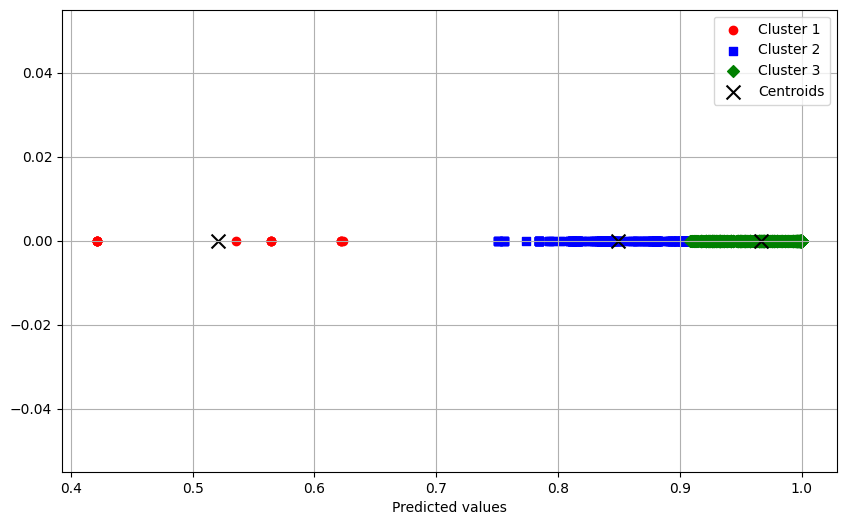


KMeans clustering using Random Forest on 11th most popular web page in each of 10 categories chosen from SimilarWeb data
Silhouette score: 0.655971884727478
Davies-Bouldin index : 0.42469849360818407
Calinski-Harabasz index: 9496.65005910196
Centroid positions: [[0.9010666]
 [0.6183133]
 [0.9756535]]
Number of data points by cluster: {0: 425, 1: 151, 2: 845}



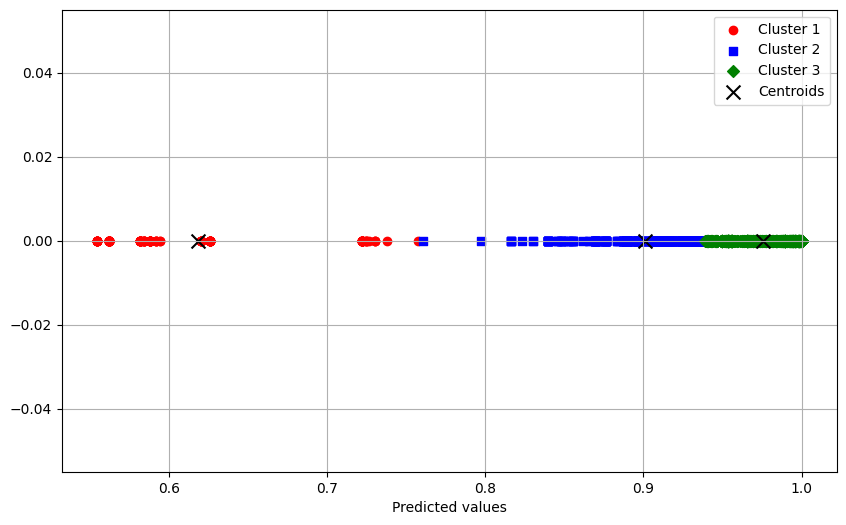

In [125]:
# perform clustering using random forest model
# Random forest (accessible web pages data)
(threshold_labels_accessible_rf, centroids_accessible_rf) = decide_on_threshold("Random Forest", "accessible", np.array(rf_predictions_accessible_data, dtype=np.float32))

# Random forest (general-use web pages data)
(threshold_labels_other_rf, centroids_other_rf) = decide_on_threshold("Random Forest", "11th most popular web page in each of 10 categories chosen from SimilarWeb", np.array(rf_predictions_other_data, dtype=np.float32))